# L1 Univariate

# Methods and models for multivariate data analysis
## List 1 - Analysis of univariate random variables

In [1]:
from datetime import datetime as dt

import pandas as pd
import numpy as np
from scipy import stats
from scipy.optimize import least_squares
import seaborn as sns
import scipy

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

# import plotly.io as pio
# pio.renderers.default='notebook'
# pd.options.display.max_columns = 50

In [2]:
df = pd.read_csv('games.csv')

In [3]:
df.sample(5)

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
8111,Sing4: The Hits Edition,Wii,2011.0,Misc,0.17,0.00,0.00,0.01,NaN,tbd,T
15080,Sheep,PS,2000.0,Strategy,0.01,0.01,0.00,0.00,71.0,tbd,E
11810,PhotoKano,PSV,2013.0,Adventure,0.00,0.00,0.07,0.00,NaN,NaN,NaN
793,Devil May Cry 3: Dante's Awakening,PS2,2005.0,Action,0.99,0.63,0.29,0.19,84.0,9,M
5424,Star Ocean: Second Evolution,PSP,2008.0,Role-Playing,0.14,0.01,0.16,0.02,75.0,7.1,T


In [4]:
display(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
Year_of_Release,16446.0,2006.484616,5.877050,1980.0,2003.0,2007.00,2010.00,2016.00
NA_sales,16715.0,0.263377,0.813604,0.0,0.0,0.08,0.24,41.36
EU_sales,16715.0,0.145060,0.503339,0.0,0.0,0.02,0.11,28.96
JP_sales,16715.0,0.077617,0.308853,0.0,0.0,0.00,0.04,10.22
Other_sales,16715.0,0.047342,0.186731,0.0,0.0,0.01,0.03,10.57
Critic_Score,8137.0,68.967679,13.938165,13.0,60.0,71.00,79.00,98.00


## 1. Substantiation of chosen subsample;

The game industry remains one of the fastest growing and most advanced industries in digital technology. Today game development is a unique interdisciplinary profession that combines technical and creative activities and does not limit the specialist in the format of work. Game company, indie development, freelancing - all these are available for a game creator. The level of development of the labor market has reached the stage when most companies are not just looking for a competent programmer or designer, but for a versatile specialist.

This dataset simply allows us to make a research on patterns of a successful game using data from Metacritic. There are 16_400+ rows in the dataset, so why assume that it's suitable for the job.


### Data description:
- `Name` — game title;
- `Platform` — computing platform an environment in which a piece of software is executed.;
- `Year_of_Release` — year of the;
- `Genre` — video game genre is an informal classification of a video game based on how it is played rather than visual or narrative elements;
- `NA_sales` — sales in North America (millions of copies sold);
- `EU_sales` — sales in Europe (millions of copies sold);
- `JP_sales` — sales in Japan (millions of copies sold);
- `Other_sales` — sales in other countries (millions of copies sold);
- `Critic_Score` — critics' score (maximum 100);
- `User_Score` — user rating (maximum 10);
- `Rating` — rating from Entertainment Software Rating Board that determines the rating of computer games and assigns them the appropriate age category.

In [4]:
df.columns = df.columns.str.lower()

In [5]:
# Удаляем отсутствующие значения столбца year_of_release. Восстанавлявать столь малый процент (1.61) не имеет смысла.
df = df.dropna(subset=['year_of_release'])
df['year_of_release'] = df['year_of_release'].astype(np.int64)

# По тем же причинам удаляем строки с отсутвием названия игры
df = df.dropna(subset=['name'])

In [6]:
df.loc[df['user_score'] == 'tbd', 'user_score'] = 'unknown'
df = df.fillna('unknown')

In [7]:
df['world_sales'] = df['na_sales'] + df['eu_sales'] + df['jp_sales'] + df['other_sales']

In [9]:
def quick_look(df:pd.DataFrame,name:str="") -> None:

    result = pd.concat((
        df.dtypes.to_frame(name="dtype").T,
        df.nunique().to_frame(name="nunique").T,
        round((df.apply(pd.Series.duplicated).sum() / df.count()).to_frame(name="duplicates").T,2),
        round(df.isna().mean().to_frame(name="NA").T,2),
        pd.DataFrame([["─"] * df.shape[1] ],columns=df.columns,index=["─ ex:"]),
        df.head(1),
        df.iloc[1:-2].sample(1),
        df.tail(1),
        pd.DataFrame([["─"] * df.shape[1]],columns=df.columns,index=["─ m:"]),
        df.min().to_frame(name="min").T,
        df.loc[:,df.dtypes != object].mean().to_frame(name="mean").T,
        df.max().to_frame(name="max").T,
    ))

    result.index.name = name

    return result.T

In [10]:
sales_by_platform = df.groupby(['platform', 'year_of_release']) \
                       .agg({'world_sales': 'sum'}) \
                       .reset_index()

fig = px.line(sales_by_platform, x="year_of_release", y="world_sales",
              color="platform", line_group="platform", hover_name="platform",
              line_shape="spline", render_mode="svg",
              title='Число продаж игр по годам в зависимости от платформы')
fig.show()

In [11]:
display(quick_look(df))

,dtype,nunique,duplicates,NA,─ ex:,0,6052,16714,─ m:,min,mean,max
name,object,11426,0.31,0.0,─,Wii Sports,Dragon Ball Heroes: Ultimate Mission,Winning Post 8 2016,─,Beyblade Burst,NaN,¡Shin Chan Flipa en colores!
platform,object,31,1.0,0.0,─,Wii,3DS,PSV,─,2600,NaN,XOne
year_of_release,int64,37,1.0,0.0,─,2006,2013,2016,─,1980,2006.486256,2016
genre,object,12,1.0,0.0,─,Sports,Misc,Simulation,─,Action,NaN,Strategy
na_sales,float64,401,0.98,0.0,─,41.36,0.0,0.0,─,0.0,0.264012,41.36
eu_sales,float64,307,0.98,0.0,─,28.96,0.0,0.0,─,0.0,0.14593,28.96
jp_sales,float64,244,0.99,0.0,─,3.77,0.29,0.01,─,0.0,0.078487,10.22
other_sales,float64,155,0.99,0.0,─,8.45,0.0,0.0,─,0.0,0.047594,10.57
critic_score,object,82,1.0,0.0,─,76.0,unknown,unknown,─,NaN,NaN,NaN
user_score,object,96,0.99,0.0,─,8,unknown,unknown,─,0,NaN,unknown


In [12]:
display(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
year_of_release,16444.0,2006.486256,5.875525,1980.0,2003.00,2007.00,2010.00,2016.00
na_sales,16444.0,0.264012,0.818378,0.0,0.00,0.08,0.24,41.36
eu_sales,16444.0,0.145930,0.506716,0.0,0.00,0.02,0.11,28.96
jp_sales,16444.0,0.078487,0.311100,0.0,0.00,0.00,0.04,10.22
other_sales,16444.0,0.047594,0.188005,0.0,0.00,0.01,0.03,10.57
world_sales,16444.0,0.536023,1.558786,0.0,0.06,0.17,0.47,82.54


In [13]:
df.corr()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,world_sales
year_of_release,1.000000,-0.092326,0.004045,-0.168477,0.037821,-0.076220
na_sales,-0.092326,1.000000,0.766546,0.451162,0.638479,0.941241
eu_sales,0.004045,0.766546,1.000000,0.435894,0.722679,0.901673
jp_sales,-0.168477,0.451162,0.435894,1.000000,0.291562,0.613305
other_sales,0.037821,0.638479,0.722679,0.291562,1.000000,0.748930
world_sales,-0.076220,0.941241,0.901673,0.613305,0.748930,1.000000


In [14]:
df_ml = df.query('critic_score != "unknown"').copy()
df_ml = df_ml.query('user_score != "unknown"')
df_ml['critic_score'] = df_ml['critic_score'].astype('int')
df_ml['user_score'] = df_ml['user_score'].astype('float')

px.imshow(df_ml.corr().round(2), 
    color_continuous_scale=[
        '#61D8A2',
        '#218457',
        '#00733E'
    ],
    origin='lower', height=600)

In [15]:
px.imshow(df.corr().round(2), 
    color_continuous_scale=[
        '#61D8A2',
        '#218457',
        '#00733E'
    ],
    origin='lower', height=600)

In [16]:
df.columns

Index(['name', 'platform', 'year_of_release', 'genre', 'na_sales', 'eu_sales',
       'jp_sales', 'other_sales', 'critic_score', 'user_score', 'rating',
       'world_sales'],
      dtype='object')

In [17]:
K = range(1, 11)

models = [KMeans(n_clusters=k, random_state=42)\
    .fit(df[[
       'year_of_release',
       'na_sales', 
       'eu_sales',
       'jp_sales',
       'world_sales']]) for k in K]

dist = [model.inertia_ for model in models]

In [18]:
# plt.plot(K, dist, marker='o')
# plt.xlabel('k')
# plt.ylabel('sum of distances')
# plt.title('The Elbow Method showing the optimal k')
# plt.show()

In [19]:
px.line(x=K, y=dist, markers=True, title='The Elbow Method showing the optimal k')

## 2. Plotting a non-parametric estimation of PDF in form of a histogram and using kernel density function (or probability law in case of discrete RV)

In [20]:
#Plotting a histogram and kernel density estimate
kernel = stats.gaussian_kde(df['year_of_release'])

min_amount, max_amount = df['year_of_release'].min(), df['year_of_release'].max()
x = np.linspace(min_amount, max_amount, len(df))
kde_values = kernel(x)

<AxesSubplot:xlabel='year_of_release'>

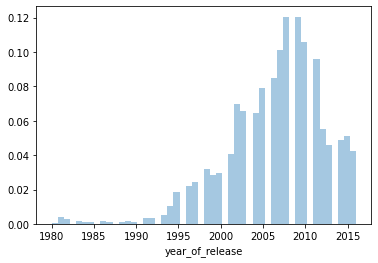

In [21]:
sns.distplot(df['year_of_release'], kde=False, norm_hist=True, label=f'Y')

In [22]:
fig = px.line(x, kde_values)

hist_data = [x]
group_labels = ['distplot'] # name of the dataset

fig.show()

In [23]:
variables = [x]
labels = ['Gotten Distribution']
fig = ff.create_distplot(variables, labels, show_hist=False)
fig.show()

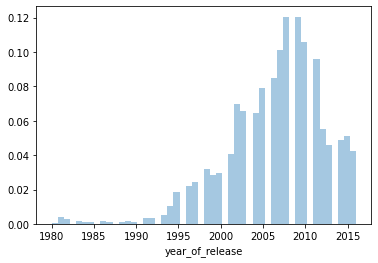

In [24]:
sns.distplot(df['year_of_release'], kde=False, norm_hist=True, label=f'Y')
fig = px.line(x, kde_values)

# plt.ylabel('p')
# plt.xlabel('Average transaction size')
# # Display values along the abscissa axis only in the interval [0, 10000]
# plt.xlim(0, 10e4)
# plt.legend()
fig.show()

hist_data = [x]
group_labels = ['distplot'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels)
fig.show()

<AxesSubplot:xlabel='na_sales', ylabel='Count'>

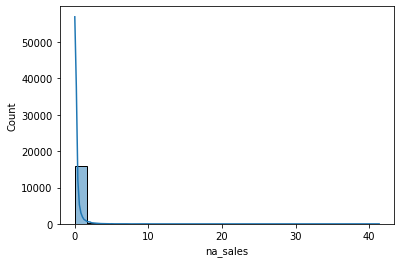

In [63]:
# sns.histplot(df['na_sales'], bins=20, kde=True)
# plt.title('Models Residuals, p_value:')
# plt.show()

sns.histplot(df['na_sales'], bins='doane',kde=True,)

In [8]:
def cut_tails(array):
    array_cut = []
    q75, q25 = np.percentile(array, [75, 25])
    interval = q75 - q25
    
    min_dist = q25 - (1.5 * interval)
    max_dist = q75 + (1.5 * interval)
    
    for data in array:
        if data < max_dist and data > min_dist:
            array_cut.append(data)
    return array_cut

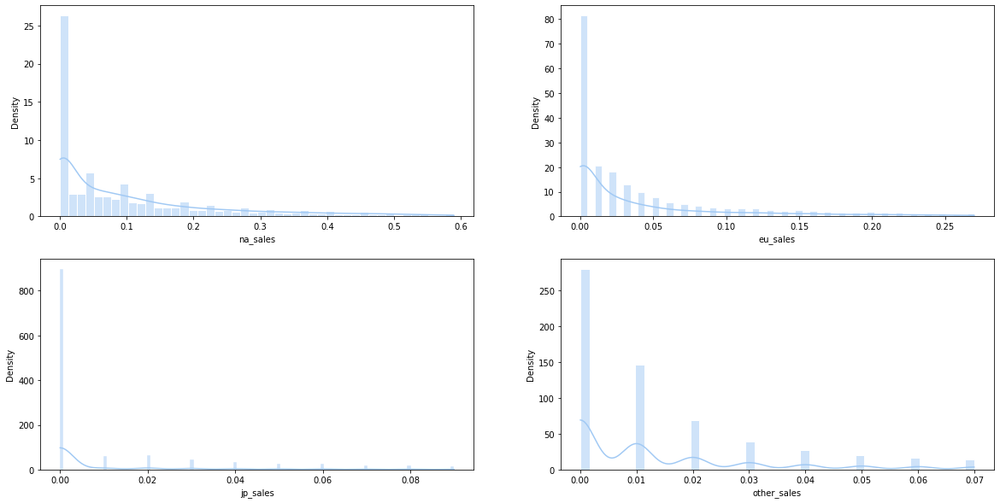

In [12]:
figure, ax = plt.subplots(2, 2, figsize=(20, 10))
sns.set_theme(style='whitegrid', palette='pastel')

age = sns.histplot(cut_tails(df.na_sales), ax=ax[0, 0], kde=True, stat='density')
age.set(xlabel='na_sales')

trestbps = sns.histplot(cut_tails(df.eu_sales), ax=ax[0, 1], kde=True, stat='density')
trestbps.set(xlabel='eu_sales')

chol = sns.histplot(cut_tails(df.jp_sales), ax=ax[1, 0], kde=True, stat='density')
chol.set(xlabel='jp_sales')

thalach = sns.histplot(cut_tails(df.other_sales), ax=ax[1, 1], kde=True, stat='density')
thalach.set(xlabel='other_sales')

plt.show()

In [27]:
def return_quantiles(series: pd.Series) -> np.array:
  """
    Function that returns quantiles 10%, 25%, 50%, 75% and 90% of input series

    :param series: input series
    :type series: pd.Series
    :return: quantiles 10%, 25%, 50%, 75% and 90%
    :rtype: np.array
  """

  return np.array([
        np.quantile(series, 0.1),
        np.quantile(series, 0.25),
        np.quantile(series, 0.5),
        np.quantile(series, 0.75),
        np.quantile(series, 0.9)
    ])
  

def plot_histplot_with_boxplot(series: pd.Series, ax_histplot: plt.Axes, ax_boxplot: plt.Axes) -> None:
  """
    Function that plots histplot and boxplot for input series with 10%, 25%, 50%, 75% and 90% quantiles

    :param series: input series
    :param ax_histplot: suplot axis for histplot
    :param ax_boxplot: suplot axis for boxplot
    :type series: pd.Series
    :type ax_histplot: plt.Axes
    :type ax_boxplot: plt.Axes
    :return: None
  """

  sns.histplot(series, ax=ax_histplot, binwidth=1, kde=False, stat='density')
  sns.boxplot(series, ax=ax_boxplot)

  plt.xlabel(series.name)

  quantiles = return_quantiles(series)

  for quantile in quantiles:
    ax_histplot.axvline(quantile, color='blue', linestyle='--')
    ax_boxplot.axvline(quantile, color='blue', linestyle='--')

In [29]:
ax

array([[%lt;AxesSubplot:ylabel='Density'%gt;, %lt;AxesSubplot:ylabel='Density'%gt;],
 [%lt;AxesSubplot:%gt;, %lt;AxesSubplot:%gt;],
 [%lt;AxesSubplot:ylabel='Density'%gt;, %lt;AxesSubplot:ylabel='Density'%gt;],
 [%lt;AxesSubplot:%gt;, %lt;AxesSubplot:%gt;]], dtype=object)

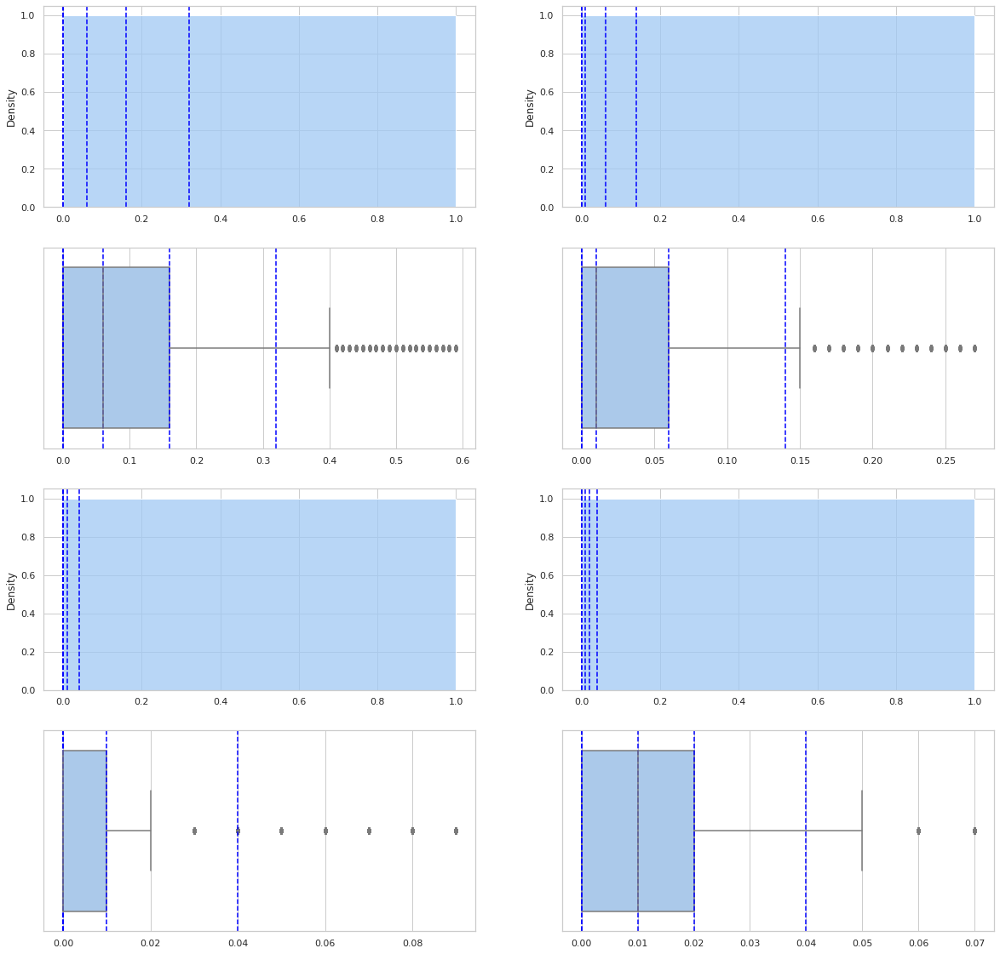

In [28]:
figure, ax = plt.subplots(4, 2, figsize=(20, 20))

plot_histplot_with_boxplot(pd.Series(cut_tails(df.na_sales)), ax[0, 0], ax[1, 0])
plot_histplot_with_boxplot(pd.Series(cut_tails(df.eu_sales)), ax[0, 1], ax[1, 1])
plot_histplot_with_boxplot(pd.Series(cut_tails(df.jp_sales)), ax[2, 0], ax[3, 0])
plot_histplot_with_boxplot(pd.Series(cut_tails(df.other_sales)), ax[2, 1], ax[3, 1])

plt.show()

In [16]:
def return_quantile(array):
    return np.array([
        np.quantile(array, 0.1),
        np.quantile(array, 0.25),
        np.quantile(array, 0.5),
        np.quantile(array, 0.75),
        np.quantile(array, 0.9)
    ])

def plot_box(array, label):
    figure, ax = plt.subplots(2, 1, figsize=(10, 10))
    sns.set_theme(style='whitegrid', palette='pastel')
    
    histplot = sns.histplot(array, ax=ax[0], kde=False, stat='density')
    boxplot = sns.boxplot(array, ax=ax[1], linewidth=0.5)
    
    histplot.set(xlabel=label)
    boxplot.set(xlabel=label)
    
    quantiles = return_quantile(array)
    for quantile in quantiles:
        ax[0].axvline(quantile, color='black', linestyle='--', alpha=0.75)
        ax[1].axvline(quantile, color='black', linestyle='--', alpha=0.75)
    
    plt.show()

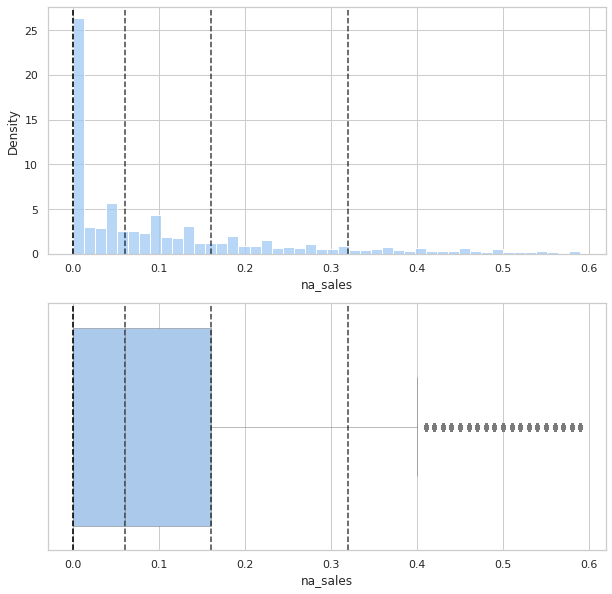

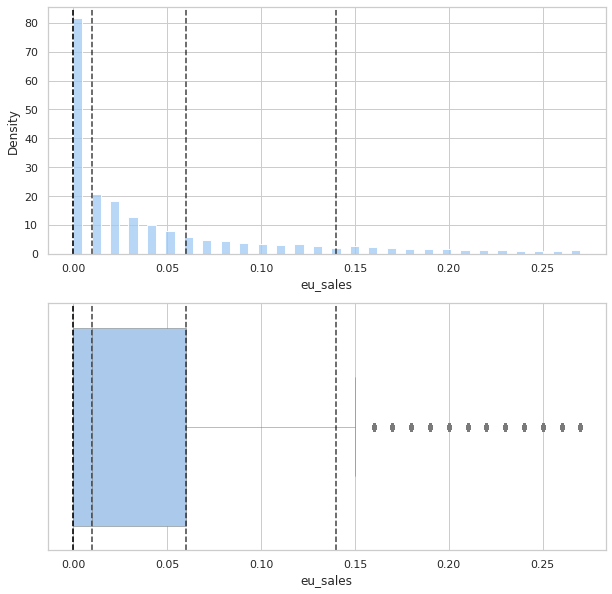

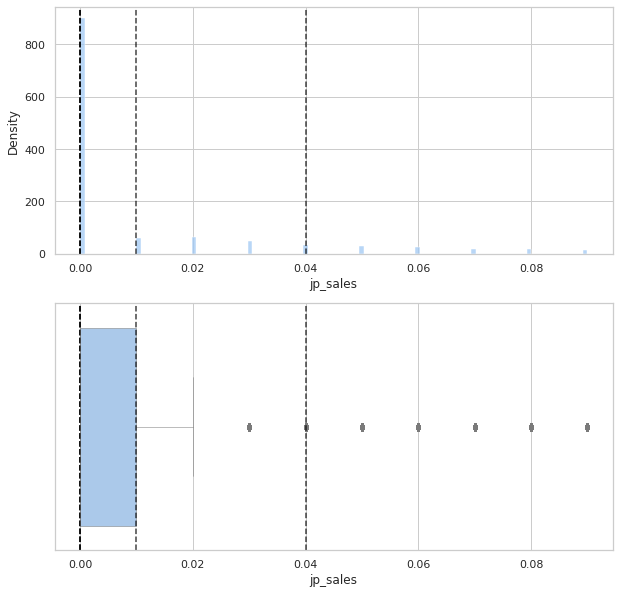

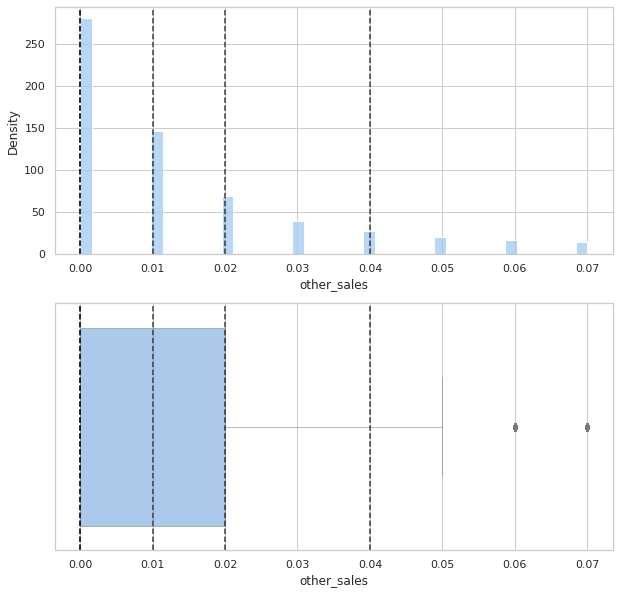

In [32]:
figure, ax = plt.subplots(4, 2, figsize=(20, 20))

plot_box(cut_tails(df.na_sales), 'na_sales', ax[0, 0], ax[1, 0])
plot_box(cut_tails(df.eu_sales), 'eu_sales', )
plot_box(cut_tails(df.jp_sales), 'jp_sales', )
plot_box(cut_tails(df.other_sales), 'other_sales', )

In [69]:
columns = ['na_sales', 'eu_sales', 'jp_sales']

for col in columns:
    fig = px.histogram(df, x=df["year_of_release"], y=df[col], title=f'Histogram of {col} distribution', marginal='violin')
    # fig.update_xaxes(showticklabels=False, title=None)
    fig.update_xaxes(tickangle=45, dtick=2, title=None)
    fig.show()

In [26]:
fig = px.histogram(df, x="year_of_release", title='Histogram of distribution', marginal='violin')
# fig.update_xaxes(showticklabels=False, title=None)
fig.update_xaxes(tickangle=45, dtick=2, title=None)


# fig.update_yaxes(title='number of games')
fig.show()

fig = px.violin(x=df['year_of_release'], box=True)
fig.update_xaxes(title='year', tickangle=45, dtick=2, range=[1980, 2016])
fig.show()

## 3. Order statistics estimation and its representation as “box with whiskers” plot.

In [27]:
after2014_df = df.query('year_of_release >= 2014')

hist_data = [after2014_df.world_sales]
group_labels = ['platform'] # name of the dataset
# group_labels = [after2014_df.world_sales] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels)
fig.show()

In [28]:
fig = px.histogram(after2014_df, x="platform", y="world_sales", color="platform")
fig.show()

fig = px.histogram(after2014_df, x="genre", y="world_sales", color="platform")
fig.show()

In [29]:
dfa = df.query('year_of_release >= 2014')

fig = px.box(dfa, x="platform", y="world_sales", color="platform", range_y=(0,2.1), title='Platforms')
fig.show()

fig = px.box(dfa, x="genre", y="world_sales", color="genre", notched=True, title='Popular genres')
fig.show()

## 4. Selection of theoretical distributions that best reflect empirical data;

"""
    Добавить сюда экспоненциальное распределение
    И подправить в отчете названия MSE -> MLE bruv;
"""

In [30]:
from scipy.stats.distributions import expon, exponnorm, exponweib, exponpow 
        
        #Missed one positional argument  ->, exponnorm, exponweib, exponpow
"""
    norm - A normal continuous random variable.
    rayleigh - A Rayleigh continuous random variable.
    gumbel_r - A right-skewed Gumbel continuous random variable.
    gumbel_l - A left-skewed Gumbel continuous random variable.
    expon - An exponential continuous random variable.
    exponnorm - An exponentially modified Normal continuous random variable.
    exponweib - An exponentiated Weibull continuous random variable.
    exponpow - An exponential power continuous random variable.
"""


distributions = [expon, exponnorm, exponweib, exponpow]
#distributions = [norm, rayleigh, gumbel_l, gumbel_r]
x = np.linspace(np.min(df['world_sales']), np.max(df['world_sales']))

## 5. Estimation of random variable distribution parameters using maximum likelihood technique and LS methods.

In [31]:
import plotly.graph_objects as go
array = df.world_sales
min_amount, max_amount = df['world_sales'].min(), df['world_sales'].max()
x = np.linspace(min_amount, max_amount, len(df['world_sales']))
MLT_list = []
LSM_list = []
for dist in distributions:
    fig = go.Figure()
    mle = dist.fit(array, method='MLE')

    print('Distribution', type(dist).__name__, 'arguments:', mle)

    def function(x, a, b):
        return getattr(scipy.stats.distributions, 'beta').pdf(x, a, b)

    xdata, ydata = np.histogram(array, bins=10, density=True)
    ls, _ = scipy.optimize.curve_fit(function, xdata=xdata[:10], ydata=ydata[:10], method='lm')
    mle_m = dist.pdf(array, *mle)
    ls_m = dist.pdf(array, *ls)
    
    print(f'Maximum Likelihood Estimation: {mle[0]}, {mle[1]}')
    MLT_list.append(mle)
    print(f'LS Method: {ls[0]}, {ls[1]}')
    LSM_list.append(ls)
    fig.add_trace(go.Scatter(x=x, y=mle_m,
                        mode='lines',
                        name='MLE'))
    fig.add_trace(go.Scatter(x=x, y=ls_m,
                        mode='markers',
                        name='LSM'))
    fig.update_layout(title=f'{type(dist).__name__} distribution')
    fig.show()

Distribution expon_gen arguments: (0.0, 0.5360234736073948)
Maximum Likelihood Estimation: 0.0, 0.5360234736073948
LS Method: 1.0, 1.0
Distribution exponnorm_gen arguments: (408.3993412484757, 0.00716557922066963, 0.001294952834217723)
Maximum Likelihood Estimation: 408.3993412484757, 0.00716557922066963
LS Method: 1.0, 1.0
Distribution exponweib_gen arguments: (1.7010912260943836, 0.5183635225198431, -4.4912099727244336e-27, 0.16245420548405085)
Maximum Likelihood Estimation: 1.7010912260943836, 0.5183635225198431
LS Method: 1.0, 1.0
Distribution exponpow_gen arguments: (0.35864892756390415, -5.556210818842893e-22, 4.7157986477675085)
Maximum Likelihood Estimation: 0.35864892756390415, -5.556210818842893e-22
LS Method: 1.0, 1.0


## 6. Validation of empirical and theoretical distributions using quantile biplots.

In [32]:
# MLT (maximum likelihood technique)
for i in range(len(distributions)):
    percs = np.linspace(0, 100, 21)
    qn_first = np.percentile(df['world_sales'], percs)
    qn_lognorm = distributions[i].ppf(percs / 100.0, *MLT_list[i])

    # Building a quantile biplot
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=qn_first, y=qn_lognorm, mode='markers', name=distributions[i].__class__.__name__))
    fig.add_trace(go.Line(x=[0,3], y=[0,3], name='line',line = dict(color='grey', width=3, dash='dash')))
    fig.update_xaxes(range=[0, 3])
    fig.update_yaxes(range=[0, 3])  
    fig.update_layout(title=distributions[i].__class__.__name__, width=800, height=800)

    fig.show()

In [33]:
# LSM
for i in range(len(distributions)):
    percs = np.linspace(0, 100, 21)
    qn_first = np.percentile(df['world_sales'], percs)
    qn_lognorm = distributions[i].ppf(percs / 100.0, *LSM_list[i])

    # Building a quantile biplot
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=qn_first, y=qn_lognorm, mode='markers', name=distributions[i].__class__.__name__))
    fig.add_trace(go.Line(x=[0,3], y=[0,3], name='line',line = dict(color='grey', width=3, dash='dash')))
    fig.update_xaxes(range=[0, 3])
    fig.update_yaxes(range=[0, 3])  
    fig.update_layout(title=distributions[i].__class__.__name__, width=800, height=800)

    fig.show()

## 7. Statistical tests (2 at least).

In [34]:
# MLE
for i in range(len(distributions)):
    ks = scipy.stats.kstest(df['world_sales'], 'lognorm', MLT_list[i][0:2], N=100)
    chi2 = scipy.stats.chisquare(df['world_sales'])
    print(distributions[i].__class__.__name__, ':')
    print(ks)
    print(chi2)
    print()

expon_gen :
KstestResult(statistic=nan, pvalue=nan)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponnorm_gen :
KstestResult(statistic=0.49640910885425105, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponweib_gen :
KstestResult(statistic=0.7714849359517226, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponpow_gen :
KstestResult(statistic=0.7378329097040996, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)



In [35]:
#LSM
for i in range(len(distributions)):
    ks = scipy.stats.kstest(df['world_sales'], 'lognorm', LSM_list[i], N=100)
    chi2 = scipy.stats.chisquare(df['world_sales'])
    print(distributions[i].__class__.__name__, ':')
    print(ks)
    print(chi2)
    print()

expon_gen :
KstestResult(statistic=0.8810880240484631, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponnorm_gen :
KstestResult(statistic=0.8810880240484631, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponweib_gen :
KstestResult(statistic=0.8810880240484631, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)

exponpow_gen :
KstestResult(statistic=0.8810880240484631, pvalue=0.0)
Power_divergenceResult(statistic=74536.6929661791, pvalue=0.0)



# L4 Stationarity

# Methods and models for multivariate data analysis
## List 4 - Stationarity of the processes

## Step 1. Choose about 3-6 variables from your dataset (2-3 – target variables, the rest - predictors).

## Step 2. Analyze stationarity of a process (for mathematical expectation and variance) for all chosen variables. Make them more stationary if needed.

## Step 3. Analyze covariance or correlation function for chosen target variables and mutual correlation functions among predictors and targets.

## Step 4. Filter high frequencies (noise) with chosen 2 filters for target variables.

## Step 5. Estimate spectral density function for with and without filtering.

## Step 6. Built auto-regression model filtered and non-filtered data. To analyze residual error and to define appropriate order of model.

## Step 7. Build model in a form of linear dynamical system, using chosen predictors. To analyze residual error and to define appropriate order of model.